# Libraries

In [75]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.


In [109]:
# import urllib library

import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import json
from urllib.request import urlopen
from tqdm.notebook import tqdm as tqdm



# Agri-Food

Looking into European Commission Portal, there is the [Agri-food Portal](https://agridata.ec.europa.eu/extensions/DataPortal/agricultural_markets.html). These site allowed us to get data from [Web API](https://agridata.ec.europa.eu/extensions/DataPortal/API_Documentation.html)


## Trade

**TAXUD imports and exports**

Weekly import statistics of agricultural products based on the "Surveillance" System of the Taxation and Customs Union DG, as shown in the imports and exports reports presented on the portal.

### API Parameters

**memberStateCodes** 
    The optional codes of the EU Member States.

**products** 
    The optional product(s) must be comma-separated. For more details check REST API : `/api/taxud/weeklyData/import/products`

**importCategories** 
    The optional import categor(ies) must be comma-separated. For more details check REST API : `/api/taxud/weeklyData/importCategories`

**marketingYears** 
    The optional marketing year(s) must have the format yyyy or yyyy/yyyy.

**months** 
    The optional month(s) to search for data.

**marketingWeeks** 
    The optional week(s) of a year to search for weekly data. The first week of January is number 1.

**sectors** 
    The optional sectors to search for data. For more details check REST API : `/api/taxud/weeklyData/sectors`

**cn8ProductCodes** 
    The optional CN 8 length product code(s). For more details check REST API : `/api/taxud/weeklyData/import/cn8ProductCodes`

**taric10ProductCodes** 
    The optional CN 10 length product code(s). For more details check REST API : `/api/taxud/weeklyData/import/taric10ProductCodes`

**partnerCodes** 
    The optional partner country code(s).

### Data

In [18]:
# Getting the products and sectors.

host_url = "https://ec.europa.eu/agrifood/"

#product
prod_url = host_url+"/api/taxud/weeklyData/import/products"
prod_df = pd.read_json(prod_url)

#Sectors
sec_url = host_url+"/api/taxud/weeklyData/sectors"
sec_df = pd.read_json(sec_url)


#### Exports

In [96]:
#Getting informations about Irish Exports for each sector available on Agrifood Portal and saving it into an DataFrame.

state = "IE" #StateCode

for i in tqdm(list(sec_df.index)):
    a = sec_df[0][i]
    a = a.replace(' ', '+')
    url_taxud = f'https://ec.europa.eu/agrifood/api/taxud/weeklyData/export?memberStateCodes={state}&sectors={a}'
    if i == 0:
        taxud_exp = pd.read_json(url_taxud)
        print(f'Read {a} {len(taxud_df)} lines')
    else: 
        df = pd.read_json(url_taxud)
        taxud_exp = pd.concat([taxud_exp, df])
        print(f'Appended {len(df)} lines of {a}')
        
    pass
   
taxud_exp.info()

  0%|          | 0/21 [00:00<?, ?it/s]

Read Honey 277 lines
Appended 6102 lines of Poultry
Appended 16689 lines of Pigs
Appended 516 lines of Sugar
Appended 80 lines of Citrus+fruit
Appended 33889 lines of Milk
Appended 1042 lines of Other+fruit+and+vegetables
Appended 221 lines of Olive+oil
Appended 25 lines of Table+olives
Appended 5 lines of Peaches+and+nectarines
Appended 28 lines of Apples
Appended 15743 lines of Spirits
Appended 8 lines of Garlic
Appended 1808 lines of Wine
Appended 13588 lines of Beef
Appended 1234 lines of Cereals
Appended 66 lines of Rice
Appended 1416 lines of Eggs
Appended 5754 lines of Sheep
Appended 239 lines of Oilseeds
Appended 5 lines of Tomato
<class 'pandas.core.frame.DataFrame'>
Int64Index: 98735 entries, 0 to 4
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   sector              98735 non-null  object 
 1   marketingYear       98735 non-null  object 
 2   marketingWeek       98735 non-null  int64  
 3 

In [97]:
taxud_exp.sample(3)

,sector,marketingYear,marketingWeek,memberStateCode,memberStateName,partnerCode,partner,product,cn8ProductCode,taric10ProductCode,procedure,preference,euroValue,unitValue,kg,kgEquivalent,coefficient
186,Honey,2020,10,IE,Ireland,US,United States of America,Natural honey,4090000,409000000,10,0,4,7.00,1,1,1.0
20542,Milk,2022,19,IE,Ireland,CO,Colombia,Casein,35011090,3501109000,10,0,1033241,10.33,100000,100000,1.0
3538,Poultry,2021,43,IE,Ireland,QU,Countries and territories not specified,Poultry preparations,16023219,1602321900,10,0,25,1.25,20,16,0.8


#### Imports

In [98]:
#Getting informations about Irish Imports for each sector available on Agrifood Portal and saving it into an DataFrame.

state = "IE" #StateCode

for i in tqdm(list(sec_df.index)):
    a = sec_df[0][i]
    a = a.replace(' ', '+')
    url_taxud = f'https://ec.europa.eu/agrifood/api/taxud/weeklyData/import?memberStateCodes={state}&sectors={a}'
    if i == 0:
        taxud_imp = pd.read_json(url_taxud)
        print(f'Read {a} {len(taxud_df)} lines')
    else: 
        df = pd.read_json(url_taxud)
        taxud_imp = pd.concat([taxud_imp, df])
        print(f'Appended {len(df)} lines of {a}')
        
    pass
      
taxud_imp.info()

  0%|          | 0/21 [00:00<?, ?it/s]

Read Honey 277 lines
Appended 6455 lines of Poultry
Appended 3410 lines of Pigs
Appended 5214 lines of Sugar
Appended 4518 lines of Citrus+fruit
Appended 7558 lines of Milk
Appended 12796 lines of Other+fruit+and+vegetables
Appended 2608 lines of Olive+oil
Appended 997 lines of Table+olives
Appended 313 lines of Peaches+and+nectarines
Appended 1497 lines of Apples
Appended 7757 lines of Spirits
Appended 1478 lines of Garlic
Appended 69424 lines of Wine
Appended 1863 lines of Beef
Appended 6749 lines of Cereals
Appended 4433 lines of Rice
Appended 382 lines of Eggs
Appended 940 lines of Sheep
Appended 3762 lines of Oilseeds
Appended 576 lines of Tomato
<class 'pandas.core.frame.DataFrame'>
Int64Index: 143780 entries, 0 to 575
Data columns (total 17 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   sector              143780 non-null  object 
 1   marketingYear       143780 non-null  object 
 2   marketingWeek       143780 

In [99]:
taxud_imp.sample(3)

,sector,marketingYear,marketingWeek,memberStateCode,memberStateName,partnerCode,partner,product,cn8ProductCode,taric10ProductCode,procedure,preference,euroValue,unitValue,kg,kgEquivalent,coefficient
50750,Wine,2017/2018,29,IE,Ireland,NZ,New Zealand,PGI Wines,22042193,2204219319,7,100,34977,4.96,7056,4939,0.7
156,Table olives,2016/2017,29,IE,Ireland,TR,Turkey,Table Olives,20057000,2005700000,40,300,11583,2.30,5033,5033,1.0
14331,Wine,2016/2017,18,IE,Ireland,AU,Australia,Still wines bottled,22042194,2204219429,40,100,657,32.86,20,20,1.0


#### Saving

Saving dataframe so we don't need to execute de API conection again and the data won't change (update). 

In [100]:
#saving as csv before add new feature
taxud_imp.to_csv('taxud_imp_ie.zip', index=False,compression='zip')
taxud_exp.to_csv('taxud_exp_ie.zip', index=False,compression='zip')

#creating new feature called flow, this way is possible to identify
taxud_imp['Flow'] = 'Import'
taxud_exp['Flow'] = 'Export'

#unifying Dataframe
trade_ie = pd.concat([taxud_imp, taxud_exp])
                     
#saving trade DataFrame
trade_ie.to_csv('trade_ie.zip', index=False,compression='zip')

In [101]:
#Importing previous DataFrame

trade_ie = pd.read_csv('trade_ie.zip')

In [107]:
trade_ie.sample(10)

,sector,marketingYear,marketingWeek,memberStateCode,memberStateName,partnerCode,partner,product,cn8ProductCode,taric10ProductCode,procedure,preference,euroValue,unitValue,kg,kgEquivalent,coefficient,Flow
5739,Poultry,2017,19,IE,Ireland,ZA,South Africa,Offals - Gallus,2071499,207149900,10,0,93708,0.76,122920,122920,1.0,Export
7013,Milk,2015,2,IE,Ireland,US,United States of America,Cheese,4069021,406902100,10,0,238669,5.48,43587,43587,1.0,Export
14866,Wine,2022/2023,8,IE,Ireland,NZ,New Zealand,PDO Wines,22042994,2204299411,4000,100,4,1.45,3,1,0.3,Import
1251,Oilseeds,2021/2022,11,IE,Ireland,CN,China,Sunflowerseed,12060091,1206009100,4000,100,650,3.69,176,176,1.0,Import
3556,Spirits,2018,35,IE,Ireland,NG,Nigeria,Whiskies,22083082,2208308200,10,0,60439,4.05,14932,14932,1.0,Export
1060,Spirits,2016,12,IE,Ireland,NO,Norway,Whiskies,22083082,2208308200,10,0,89929,4.56,19705,19705,1.0,Export
2028,Poultry,2019,37,IE,Ireland,ZA,South Africa,Frozen meat - Gallus,2071420,207142000,10,0,313061,1.12,279140,279140,1.0,Export
12808,Milk,2016,29,IE,Ireland,TN,Tunisia,Cheese,4069021,406902100,10,0,311646,2.54,122837,122837,1.0,Export
5722,Poultry,2022,27,IE,Ireland,GH,Ghana,Fresh meat - Gallus,2071330,207133000,10,0,108332,1.50,72400,72400,1.0,Export
595,Eggs,2019,14,IE,Ireland,QA,Qatar,Fresh eggs in shell,4072100,407210000,10,0,15672,7.49,2092,2092,1.0,Export


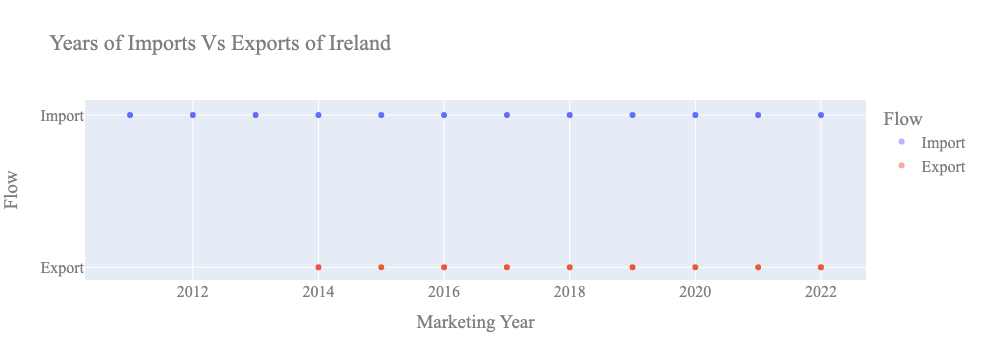

In [113]:
plot = px.scatter(trade_ie, 
           x="marketingYear", 
           y="Flow", 
           color="Flow",
         title="Years of Imports Vs Exports of Ireland",
                labels={
                     "marketingYear": "Marketing Year",
                     "Flow": "Flow"
                 },opacity = 0.5)
plot.update_layout(
    font_family="Times New Roman",
    font_color="#7f7f7f",
    font_size = int(16))
plot.update_layout()

## Price

In [7]:
# store the URL in url as 
url = "https://www.ec.europa.eu/agrifood/api/beef/prices?memberStateCodes=PT&years=2019,2020&months=1,3,9&weeks=5,6,7,8,40,41,42&beginDate=01/09/2019&endDate=02/02/2020&carcassCategories=heifers,cows"
  
# store the response of URL
response = urlopen(url)
  
# storing the JSON response 
# from url in data
data_json = json.loads(response.read())


In [11]:
df = pd.read_json(url)
df.sample(2)

,memberStateCode,memberStateName,beginDate,endDate,weekNumber,price,unit,category,productCode
55,PT,Portugal,30/09/2019,06/10/2019,40,€342.00,€/100Kg,Young cattle,Z O2
16,PT,Portugal,27/01/2020,02/02/2020,5,€334.80,€/100Kg,Bulls,B R3
